In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
%pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import glob
from sklearn.metrics import confusion_matrix
import seaborn as sn; sn.set(font_scale=1.4)
from sklearn.utils import shuffle           
from tqdm import tqdm
import os

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, layers, models

In [ ]:
import PIL
import PIL.Image
import tensorflow_datasets as tfds

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

In [ ]:
data_dir = '/content/gdrive/MyDrive/tugas-akhir-dhifaf/dataset-ta/all-aug-ex-1-1'

In [ ]:
# data_dir = pathlib.Path(data_dir)
data_dir = '/content/gdrive/MyDrive/tugas-akhir-dhifaf/dataset-ta/..'
batch_size = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(256, 256),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(256, 256),
  batch_size=batch_size)

val_batches = tf.data.experimental.cardinality(val_ds)
test_dataset = val_ds.take(val_batches//2)
val_ds = val_ds.skip(val_batches//2)

print('Batches for training -->', train_ds.cardinality())
print('Batches for testing -->', test_dataset.cardinality())
print('Batches for validating -->', val_ds.cardinality())


Found 14976 files belonging to 5 classes.
Using 11981 files for training.
Found 14976 files belonging to 5 classes.
Using 2995 files for validation.
Batches for training --> tf.Tensor(375, shape=(), dtype=int64)
Batches for testing --> tf.Tensor(47, shape=(), dtype=int64)
Batches for validating --> tf.Tensor(47, shape=(), dtype=int64)


In [ ]:
class_names = train_ds.class_names
class_names

['A', 'AB', 'B', 'BC', 'E']

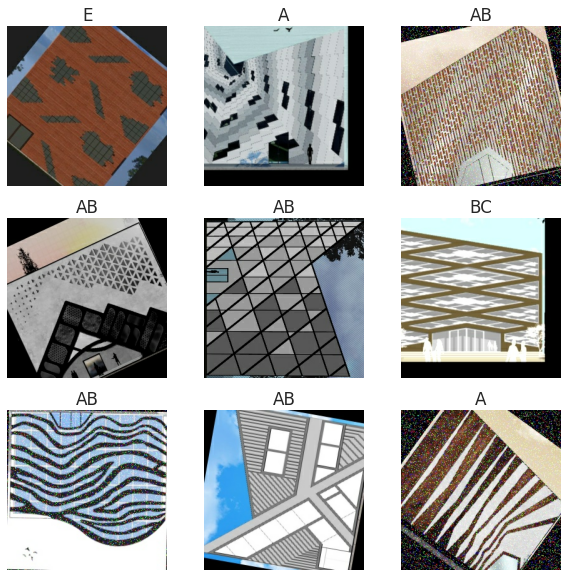

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

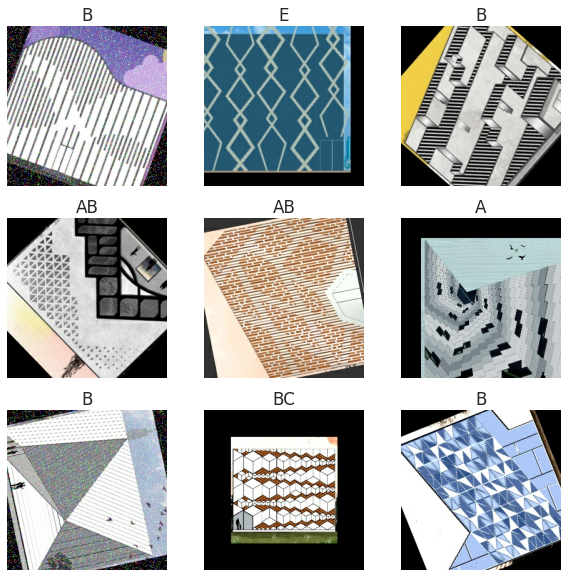

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

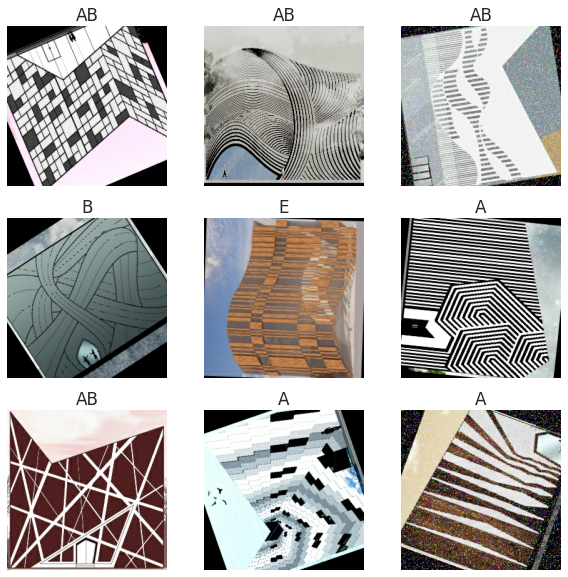

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in test_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32,)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

# train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
# train_labels = np.concatenate([y for x, y in train_ds], axis=0)
# val_labels = np.concatenate([y for x, y in val_ds], axis=0)
# test_labels = np.concatenate([y for x, y in test_dataset], axis=0)

In [ ]:
# import pandas as pd

# _, train_counts = np.unique(train_labels, return_counts=True)
# _, val_counts = np.unique(val_labels, return_counts=True)
# _, test_counts = np.unique(test_labels, return_counts=True)
# pd.DataFrame({'train': train_counts,
#                     'test': test_counts,
#                           'val': val_counts}, 
#              index=class_names
#             ).plot.bar()
# plt.show()

In [ ]:
inputs = keras.Input(shape=(256, 256, 3), name="input_1")
rescalling = layers.Rescaling(1./255)(inputs)

x = layers.Conv2D(32, (3, 3), strides=(2,2), padding='same')(rescalling)
x = layers.MaxPooling2D(2)(x)
x = layers.BatchNormalization()(x)
block_1_output = layers.Activation('relu')(x)

x = layers.Conv2D(64, (3, 3), strides=(1,1), padding='same')(block_1_output)
x = layers.BatchNormalization()(x)
block_2_output = layers.MaxPooling2D(2)(x)

x = layers.Conv2D(128, (3, 3), strides=(2,2), padding='same')(block_2_output)
block_3_output = x

x = layers.Activation('relu')(block_2_output)
x = layers.SeparableConv2D(128, (3, 3), strides=(1,1), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(2)(x)
block_4_output = layers.add([x, block_3_output])

x = layers.Conv2D(256, (3, 3), strides=(2,2), padding='same')(block_4_output)
block_5_output = x

x = layers.Activation('relu')(block_4_output)
x = layers.SeparableConv2D(256, (3, 3), strides=(1,1), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(2)(x)
block_6_output = layers.add([x, block_5_output])

x = layers.Conv2D(384, (3, 3), strides=(2,2), padding='same')(block_6_output)
block_7_output = x

x = layers.Activation('relu')(block_6_output)
x = layers.SeparableConv2D(384, (3, 3), strides=(1,1), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(2)(x)
block_8_output = layers.add([x, block_7_output])

x = layers.Conv2D(512, (3, 3), strides=(1,1), padding='same')(block_8_output)
block_9_output = x

x = layers.Activation('relu')(block_8_output)
x = layers.SeparableConv2D(512, (3, 3), strides=(1,1), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(1)(x)
block_10_output = layers.add([x, block_9_output])

x = layers.SeparableConv2D(768, (3, 3), strides=(1,1), padding='same')(block_10_output)
x = layers.BatchNormalization()(x)
x = layers.Activation('relu')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(5, activation='softmax')(x)
outputs = x

model = keras.Model(inputs, outputs, name="Dhifaf_net")
model.summary()

Model: "Dhifaf_net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  896         ['rescaling[0][0]']              
                                )                                                                 
                                                                                         

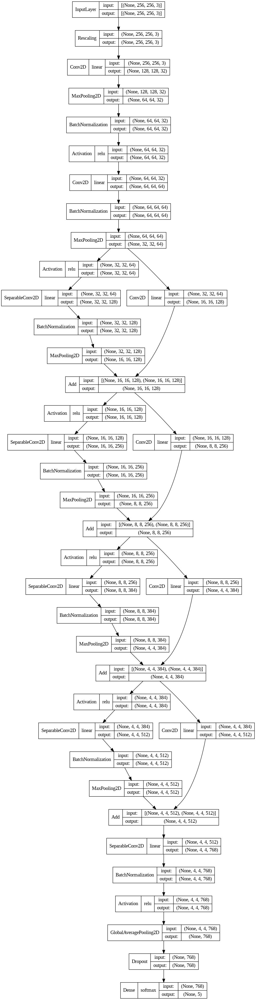

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=False,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

In [ ]:
# tf.keras.backend.clear_session()
from tensorflow.keras.callbacks import EarlyStopping
# early_stopping = EarlyStopping()
from tensorflow.keras.callbacks import ModelCheckpoint
custom_early_stopping = EarlyStopping(
    monitor='val_accuracy', 
    patience=20, 
    min_delta=0.001, 
    mode='max'
)
checkpoint = ModelCheckpoint('model-{epoch:03d}-{accuracy:03f}-{val_accuracy:03f}.h5', verbose=1, monitor='val_loss',save_best_only=True, mode='auto')  

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.01)
model.compile(optimizer = opt, loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(train_ds, batch_size=64, epochs=100, validation_data = val_ds, callbacks=[tensorboard_callback, checkpoint, custom_early_stopping])

Epoch 1/100
375/375 [==============================] - ETA: 0s - loss: 1.4049 - accuracy: 0.4228
Epoch 1: val_loss improved from inf to 3.68428, saving model to model-001-0.422753-0.434608.h5
375/375 [==============================] - 1950s 525ms/step - loss: 1.4049 - accuracy: 0.4228 - val_loss: 3.6843 - val_accuracy: 0.4346
Epoch 2/100
375/375 [==============================] - ETA: 0s - loss: 0.9214 - accuracy: 0.6080
Epoch 2: val_loss improved from 3.68428 to 3.17652, saving model to model-002-0.607963-0.456740.h5
375/375 [==============================] - 16s 42ms/step - loss: 0.9214 - accuracy: 0.6080 - val_loss: 3.1765 - val_accuracy: 0.4567
Epoch 3/100
375/375 [==============================] - ETA: 0s - loss: 0.7451 - accuracy: 0.6993
Epoch 3: val_loss did not improve from 3.17652
375/375 [==============================] - 15s 41ms/step - loss: 0.7451 - accuracy: 0.6993 - val_loss: 3.4846 - val_accuracy: 0.5030
Epoch 4/100
375/375 [==============================] - ETA: 0s - l

In [ ]:
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "acc")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

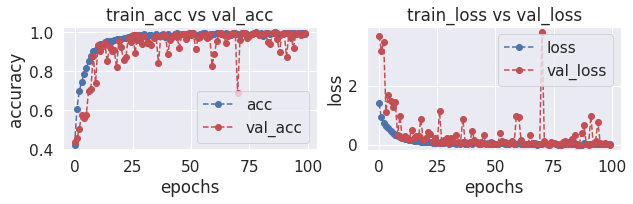

In [ ]:
plot_accuracy_loss(history)

In [ ]:
test_loss = model.evaluate(test_dataset)
test_loss

47/47 [==============================] - 2s 42ms/step - loss: 0.0073 - accuracy: 0.9973


[0.007328830659389496, 0.9973404407501221]

In [ ]:
print(test_dataset)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [ ]:
true_categories = tf.concat([y for x, y in test_dataset], axis=0)
print(true_categories)

tf.Tensor([1 0 0 ... 0 2 0], shape=(1504,), dtype=int32)


In [ ]:
y_pred = []  # store predicted labels
y_true = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in test_dataset:   # use dataset.unbatch() with repeat
   # append true labels
   y_true.append(label_batch)
   # compute predictions
   preds = model.predict(image_batch)
   # append predicted labels
   y_pred.append(np.argmax(preds, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)

1/1 [==============================] - 0s 32ms/step


In [ ]:
# pred_labels = np.array([])
# test_labels =  np.array([])

# for x, y in test_dataset:
#   predicted_classes = np.concatenate([pred_labels,
#                        np.argmax(model(x), axis = -1)])
#   true_classes = np.concatenate([test_labels, np.argmax(y.numpy(), axis=-1)])

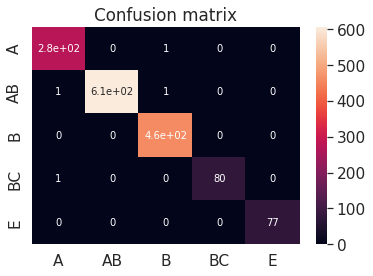

In [ ]:
CM = confusion_matrix(correct_labels, predicted_labels)
ax = plt.axes()
sn.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix')
plt.show()

In [ ]:
# model.save('/content/gdrive/MyDrive/tugas-akhir-dhifaf/new-model-ex1-gabung-dataset-2-22644/my_model')

model.save('/content/gdrive/MyDrive/tugas-akhir-dhifaf/new-model-ex1-gabung-dataset-1-14987/my_model')

In [ ]:
# Loading the Tensorflow Saved Model (PB)
h5_model = "./mymodel.h5"
# model = tf.keras.models.load_model('/content/gdrive/MyDrive/tugas-akhir-dhifaf/new-model-ex1-gabung-dataset-2-22644/my_model')
model = tf.keras.models.load_model('/content/gdrive/MyDrive/tugas-akhir-dhifaf/new-model-ex1-gabung-dataset-1-14987/my_model')
print(model.summary())

# Saving the Model in H5 Format
tf.keras.models.save_model(model, h5_model)

# Loading the H5 Saved Model
loaded_model_from_h5 = tf.keras.models.load_model(h5_model)
print(loaded_model_from_h5.summary())

Model: "Dhifaf_net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  896         ['rescaling[0][0]']              
                                )                                                                 
                                                                                         

In [ ]:
# !zip -r logs-tensorboard-ex1-gabung-data-2-22644.zip {'/content/logs'}
!zip -r logs-tensorboard-ex1-gabung-data-1-14987.zip {'/content/logs'}

  adding: content/logs/ (stored 0%)
  adding: content/logs/20230221-000105/ (stored 0%)
  adding: content/logs/20230221-000105/train/ (stored 0%)
  adding: content/logs/20230221-000105/train/events.out.tfevents.1676937665.11b466393dbb.9241.0.v2 (deflated 65%)
  adding: content/logs/20230221-000105/validation/ (stored 0%)
  adding: content/logs/20230221-000105/validation/events.out.tfevents.1676939433.11b466393dbb.9241.1.v2 (deflated 79%)
